## Visualizing earthquakes

Let's use Plotly to make an exploratory analysis of a dataset that gathers data from various incidents around the world, and in particular lots of earthquakes that have occured since 1965 !

The dataset is available on Kaggle, you can download it and you'll find a description here :  https://www.kaggle.com/usgs/earthquake-database

## Beginning with the dataset

1. Import pandas and the different packages of Plotly

In [17]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio
# pio.renderers.default = "svg" # this line must be commented if working on colab

pd.options.display.max_columns = None


2. Read the file and show the first rows as well as basic statistics about the dataset

In [20]:
df = pd.read_csv("earthquakes.csv")
df.describe(include='all')

,Date,Time,Latitude,Longitude,Type,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Type,Magnitude Error,Magnitude Seismic Stations,Azimuthal Gap,Horizontal Distance,Horizontal Error,Root Mean Square,ID,Source,Location Source,Magnitude Source,Status
count,23409,23409,23409.000000,23409.000000,23409,23409.000000,4460.000000,7096.000000,23409.000000,23406,327.000000,2564.000000,7298.000000,1604.000000,1156.000000,17350.000000,23409,23409,23409,23409,23409
unique,12398,20469,NaN,NaN,4,NaN,NaN,NaN,NaN,10,NaN,NaN,NaN,NaN,NaN,NaN,23409,13,48,24,2
top,03/11/2011,14:09:03,NaN,NaN,Earthquake,NaN,NaN,NaN,NaN,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM860706,US,US,US,Reviewed
freq,128,5,NaN,NaN,23229,NaN,NaN,NaN,NaN,7721,NaN,NaN,NaN,NaN,NaN,NaN,1,20627,20347,10457,20770
mean,NaN,NaN,1.678763,39.636726,NaN,70.748526,4.991118,275.362176,5.882558,NaN,0.071820,48.944618,44.165158,3.992660,7.662759,1.022766,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,30.113379,125.514881,NaN,122.605748,4.873905,162.152976,0.423084,NaN,0.051466,62.943106,32.143388,5.377262,10.430396,0.188544,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,-77.080000,-179.997000,NaN,-1.100000,0.000000,0.000000,5.500000,NaN,0.000000,0.000000,0.000000,0.004505,0.085000,0.000000,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,-18.652000,-76.352000,NaN,14.530000,1.800000,146.000000,5.600000,NaN,0.046000,10.000000,24.100000,0.968750,5.300000,0.900000,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,-3.569000,103.981000,NaN,33.000000,3.500000,255.000000,5.700000,NaN,0.059000,28.000000,36.000000,2.319500,6.700000,1.000000,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,26.188000,145.027000,NaN,54.000000,6.300000,384.000000,6.000000,NaN,0.075500,66.000000,54.000000,4.724500,8.100000,1.130000,NaN,NaN,NaN,NaN,NaN


In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23409 entries, 0 to 23408
Data columns (total 21 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Date                        23409 non-null  object 
 1   Time                        23409 non-null  object 
 2   Latitude                    23409 non-null  float64
 3   Longitude                   23409 non-null  float64
 4   Type                        23409 non-null  object 
 5   Depth                       23409 non-null  float64
 6   Depth Error                 4460 non-null   float64
 7   Depth Seismic Stations      7096 non-null   float64
 8   Magnitude                   23409 non-null  float64
 9   Magnitude Type              23406 non-null  object 
 10  Magnitude Error             327 non-null    float64
 11  Magnitude Seismic Stations  2564 non-null   float64
 12  Azimuthal Gap               7298 non-null   float64
 13  Horizontal Distance         160

3. In the following, we will use a lot the `Date` column. To avoid problems with your visualizations, use pandas to convert this column into `Datetime` type :

In [24]:
df["Date"] = pd.to_datetime(df["Date"], format="%m/%d/%Y")
df = df.sort_values("Date")
df

,Date,Time,Latitude,Longitude,Type,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Type,Magnitude Error,Magnitude Seismic Stations,Azimuthal Gap,Horizontal Distance,Horizontal Error,Root Mean Square,ID,Source,Location Source,Magnitude Source,Status
0,1965-01-02,13:44:18,19.2460,145.6160,Earthquake,131.60,NaN,NaN,6.0,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM860706,ISCGEM,ISCGEM,ISCGEM,Automatic
1,1965-01-04,11:29:49,1.8630,127.3520,Earthquake,80.00,NaN,NaN,5.8,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM860737,ISCGEM,ISCGEM,ISCGEM,Automatic
2,1965-01-05,18:05:58,-20.5790,-173.9720,Earthquake,20.00,NaN,NaN,6.2,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM860762,ISCGEM,ISCGEM,ISCGEM,Automatic
3,1965-01-08,18:49:43,-59.0760,-23.5570,Earthquake,15.00,NaN,NaN,5.8,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM860856,ISCGEM,ISCGEM,ISCGEM,Automatic
4,1965-01-09,13:32:50,11.9380,126.4270,Earthquake,15.00,NaN,NaN,5.8,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM860890,ISCGEM,ISCGEM,ISCGEM,Automatic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23405,2016-12-28,09:13:47,38.3777,-118.8957,Earthquake,8.80,2.0,33.0,5.5,ML,0.260,18.0,48.58,0.129,NaN,0.2187,NN00570744,NN,NN,NN,Reviewed
23403,2016-12-28,08:18:01,38.3754,-118.8977,Earthquake,10.80,1.3,34.0,5.6,ML,0.350,20.0,35.86,0.132,NaN,0.1988,NN00570709,NN,NN,NN,Reviewed
23406,2016-12-28,12:38:51,36.9179,140.4262,Earthquake,10.00,1.8,NaN,5.9,MWW,NaN,NaN,91.00,0.992,4.8,1.5200,US10007NAF,US,US,US,Reviewed
23407,2016-12-29,22:30:19,-9.0283,118.6639,Earthquake,79.00,1.8,NaN,6.3,MWW,NaN,NaN,26.00,3.553,6.0,1.4300,US10007NL0,US,US,US,Reviewed


## Exploring the number of observations over time

4. Make a simple plot with plotly express to display the number of observed events as a function of time

In [27]:
fig = px.histogram(df, "Date")
fig.show()

If the `Date` column was converted into `Datetime`, plotly handles it and has automatically set the number of bins such that the counts are made by year. This makes the histogram easily readable.

In the following, you will create customized plots with plotly.graph_objects to display more accurate information about the number of events.

5. With plotly.graph_objects, create a histogram with a range slider such that you can visualize the daily number of events

In [32]:
fig = go.Figure(
    data = go.Histogram(
        x= df["Date"], nbinsx=df["Date"].nunique()),
    layout= go.Layout(
        title= go.layout.Title(text="Number of observations"), xaxis = go.layout.XAxis(title="X", rangeslider=go.layout.xaxis.Rangeslider(visible = True))

    ))

fig.show()

In [28]:
fig = go.Figure()

fig.add_trace(go.Histogram(
    x=df["Date"], xbins=dict(size=86_400_000)
))
fig.update_layout(title_text = "Daily_number_of_events",
                  xaxis = dict(rangeslider = dict(visible = True),
                               type = "date"))
fig.show()

6. We would like to check if there's some seasonality in the number of events. Create new columns in the dataset with the id of the month and year. Then use plotly's `make_subplots` function to display the monthly number of observations over a given year, independently for each of the five last years (so, there will be 5 independent histograms)

In [50]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 23410 entries, 0 to Year
Data columns (total 24 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   Date                        23409 non-null  datetime64[ns]
 1   Time                        23409 non-null  object        
 2   Latitude                    23409 non-null  float64       
 3   Longitude                   23409 non-null  float64       
 4   Type                        23409 non-null  object        
 5   Depth                       23409 non-null  float64       
 6   Depth Error                 4460 non-null   float64       
 7   Depth Seismic Stations      7096 non-null   float64       
 8   Magnitude                   23409 non-null  float64       
 9   Magnitude Type              23406 non-null  object        
 10  Magnitude Error             327 non-null    float64       
 11  Magnitude Seismic Stations  2564 non-null   float64       
 

In [66]:
df.loc[:, 'Year'] = df["Date"].dt.year.astype("Int64")
df.loc[:, 'month'] = df["Date"].dt.month
df["month_id"] = df["Date"].dt.month
df

C:\Users\dubos\AppData\Local\Temp\ipykernel_19636\2319699208.py:1: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '<IntegerArray>
[1965, 1965, 1965, 1965, 1965, 1965, 1965, 1965, 1965, 1965,
 ...
 2016, 2016, 2016, 2016, 2016, 2016, 2016, 2016, 2016, <NA>]
Length: 23410, dtype: Int64' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



,Date,Time,Latitude,Longitude,Type,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Type,Magnitude Error,Magnitude Seismic Stations,Azimuthal Gap,Horizontal Distance,Horizontal Error,Root Mean Square,ID,Source,Location Source,Magnitude Source,Status,Year,month,month_id
0,1965-01-02,13:44:18,19.2460,145.6160,Earthquake,131.60,NaN,NaN,6.0,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM860706,ISCGEM,ISCGEM,ISCGEM,Automatic,1965,1.0,1.0
1,1965-01-04,11:29:49,1.8630,127.3520,Earthquake,80.00,NaN,NaN,5.8,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM860737,ISCGEM,ISCGEM,ISCGEM,Automatic,1965,1.0,1.0
2,1965-01-05,18:05:58,-20.5790,-173.9720,Earthquake,20.00,NaN,NaN,6.2,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM860762,ISCGEM,ISCGEM,ISCGEM,Automatic,1965,1.0,1.0
3,1965-01-08,18:49:43,-59.0760,-23.5570,Earthquake,15.00,NaN,NaN,5.8,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM860856,ISCGEM,ISCGEM,ISCGEM,Automatic,1965,1.0,1.0
4,1965-01-09,13:32:50,11.9380,126.4270,Earthquake,15.00,NaN,NaN,5.8,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM860890,ISCGEM,ISCGEM,ISCGEM,Automatic,1965,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23403,2016-12-28,08:18:01,38.3754,-118.8977,Earthquake,10.80,1.3,34.0,5.6,ML,0.350,20.0,35.86,0.132,NaN,0.1988,NN00570709,NN,NN,NN,Reviewed,2016,12.0,12.0
23406,2016-12-28,12:38:51,36.9179,140.4262,Earthquake,10.00,1.8,NaN,5.9,MWW,NaN,NaN,91.00,0.992,4.8,1.5200,US10007NAF,US,US,US,Reviewed,2016,12.0,12.0
23407,2016-12-29,22:30:19,-9.0283,118.6639,Earthquake,79.00,1.8,NaN,6.3,MWW,NaN,NaN,26.00,3.553,6.0,1.4300,US10007NL0,US,US,US,Reviewed,2016,12.0,12.0
23408,2016-12-30,20:08:28,37.3973,141.4103,Earthquake,11.94,2.2,NaN,5.5,MB,0.029,428.0,97.00,0.681,4.5,0.9100,US10007NTD,US,US,US,Reviewed,2016,12.0,12.0


In [65]:
from plotly.subplots import make_subplots
df_copy = df.copy()
df_copy["Year"] = df_copy["Year"].astype(int)
df_copy["month"] = df_copy["month"].astype(int, errors='ignore')
#obtenir la derniere année du df et la première année du df
print(df_copy["Year"].max())
print(df_copy["Year"].min())

#on ne garde que les 5 dernières années du df 
df_five_last_years = df_copy[df_copy["Year"] >= df_copy["Year"].max() - 5]
print(df_five_last_years["Year"].unique())

fig = make_subplots(rows=6,cols=1)
j=1
#on va boucler sur les 5 dernières années du df et faire un histogramme pour chaque année
#On calcule le range d'années à partir du df_five_last_years
max_year=df_five_last_years["Year"].max()
min_year=df_five_last_years["Year"].min()

for i in range(min_year, max_year):
    df_year = df_five_last_years[df_five_last_years["Year"] == int(i)]

    #on vérifie que le df_year n'est pas vide avant de faire l'histogramme
    if df_year.empty:
        print(f"→ Aucune donnée pour l'année {year} (ligne ignorée)")
        continue
    #on se sert d'une figure temporaire qui sera ecrasée après avoir étée utilisée pour ajouter la trace à la figure finale
    fig_tmp=go.Figure()
    fig_tmp.add_trace(go.Histogram(x=df_year["Date"], nbinsx=50))
    fig_tmp.update_layout(title=go.layout.Title(text=f'Number of observations per day for the year {i}', x=0.5))
    fig_tmp.update_layout(xaxis_title='X')
    fig_tmp.update_layout(width=700, height=500)
    fig.add_trace(fig_tmp['data'][0], row=j, col=1)
    #on incrémente le compteur de row utilisé dans le subplot pour la figure finale()
    j+=1

#on finalise le layout global fig
fig.update_layout(height=1500, showlegend=False)
fig.update_layout(title_text="Number of observations per day for the last 5 years")
fig.show()

IntCastingNaNError: Cannot convert non-finite values (NA or inf) to integer

In [41]:
last_years= [2012, 2013, 2014, 2015, 2016]
fig = make_subplots(rows=5, cols=1, shared_xaxes=True, vertical_spacing=0.01)
for i in range(len(last_years)):
    fig.add_trace(go.Histogram(
        x = df.loc[df["Year"] == last_years[i], "month"],
        name= str(last_years[i]),
    ),
    row= i+1,
    col=1
    )

fig.show()

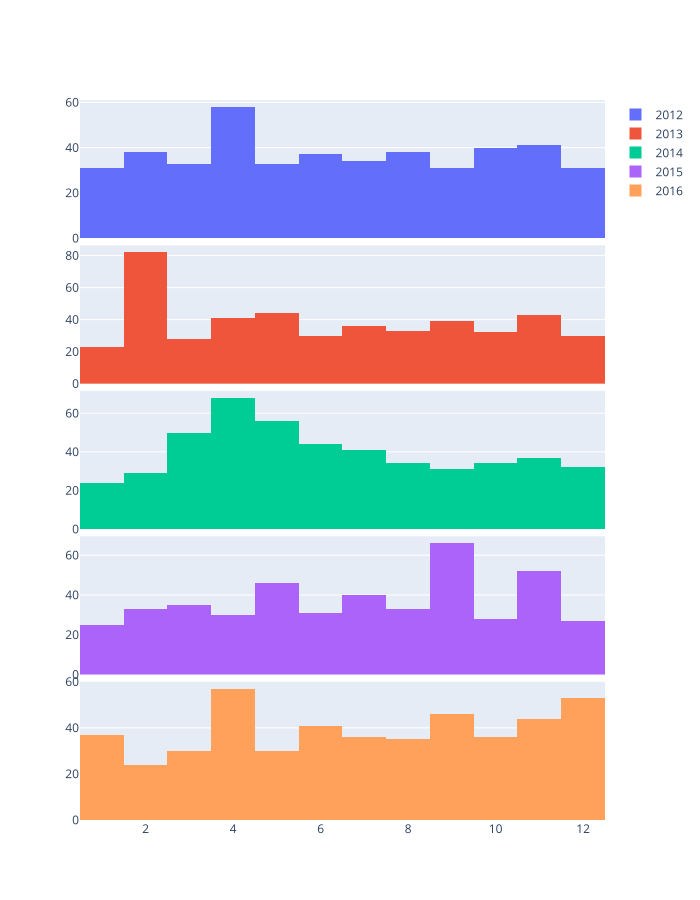

7. Now, we would like to allow the user to choose a specific year among the five last years, and display the daily number of observations fot this year only. Use the `Updatemenu` and `Button` classes together with `add_trace` to create an interactive visualization.

In [ ]:
fig = go.Figure()

fig.add_trace(go.Histogram(x=df.loc[df['Year'] == last_years[0] ,"Date" ],visible=True))
fig.add_trace(go.Histogram(x=df.loc[df['Year'] == last_years[1] ,'Date'],visible=False))
fig.add_trace(go.Histogram(x=df.loc[df['Year'] == last_years[2] ,'Date'],visible=False))
fig.add_trace(go.Histogram(x=df.loc[df['Year'] == last_years[3] ,'Date'],visible=False))
fig.add_trace(go.Histogram(x=df.loc[df['Year'] == last_years[4] ,'Date'],visible=False))

fig.update_layout(title_text= "Daily Observation for one year"),

fig.update_layout(updatemenus=[go.layout.Updatemenu(
    active=0,
    buttons=[
        go.layout.updatemenu.Button(
            label='2012',
            method='update',
            args=[
                {'visible': [True, False, False, False,False]},
                {'title': {'text': '2012  Daily Observation for one year'}}
            ],
        ),
        go.layout.updatemenu.Button(
            label='2013',
            method='update',
            args=[
                {'visible': [False, True, False, False,False]},
                {'title': {'text': '2013  Daily Observation for one year'}}
            ],
        ),
        go.layout.updatemenu.Button(
            label='2014',
            method='update',
            args=[
                {'visible': [False, False, True, False, False]},
                {'title': {'text': '2014  Daily Observation for one year'}}
            ],
        ),
        go.layout.updatemenu.Button(
            label='2015',
            method='update',
            args=[
                {'visible': [False, False, False, True, False]},
                {'title': {'text': '2015  Daily Observation for one year'}}
            ],
        ),
        go.layout.updatemenu.Button(
            label='2016',
            method='update',
            args=[
                {'visible':[False, False, False, False, True]},
                {'title': {'text':'2016  Daily Observation for one year'}}
            ]
        )
    ],
    type='buttons' # Makes all buttons visible 
)])

fig.show()

In [ ]:

last_years = [2012, 2013, 2014, 2015, 2016]

fig = go.Figure()
button_list = []
for i in range(len(last_years)):
    if i == 0:
        fig.add_trace(
            go.Histogram(
                x = df.loc[df['Year']==last_years[i], 'Date'],
                nbinsx = df.loc[df['Year']==last_years[i], 'Date'].nunique(),
                visible=True))
    else:
        fig.add_trace(
            go.Histogram(
                x = df.loc[df['Year']==last_years[i], 'Date'],
                nbinsx = df.loc[df['Year']==last_years[i], 'Date'].nunique(),
                visible=False))
        
    args_list = [False  if (i != j) else True for j in range(len(last_years))]
    temp_button = go.layout.updatemenu.Button(
        label = last_years[i],
        method = "update",
        args = [{"visible" : args_list}]
    )
    button_list.append(temp_button)

fig.update_layout(
        title = go.layout.Title(text = "Daily observations for one year", x = 0.5),
        showlegend = False)


fig.update_layout(
    updatemenus = [go.layout.Updatemenu(
        active = 0,
        buttons = button_list
    )]
)

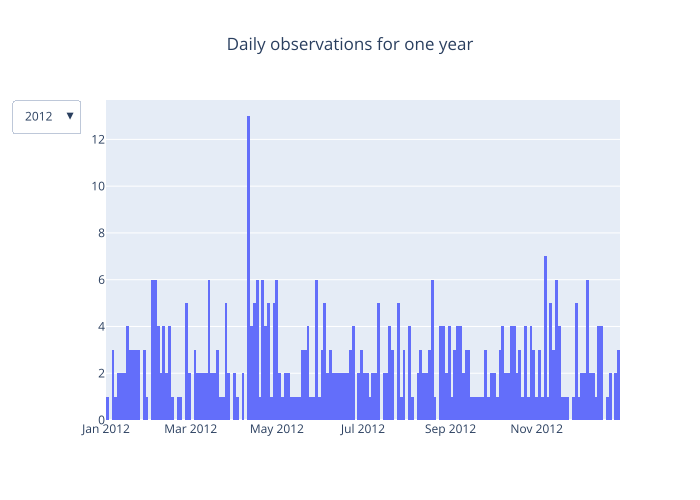

## Focusing on earthquakes

8. Use plotly express to display the proportions of each type of events in the dataset

In [67]:
event_counts = df["Type"].value_counts().reset_index()
event_counts.columns = ["Type", "count"]
print(event_counts)

                Type  count
0         Earthquake  23229
1  Nuclear Explosion    175
2          Explosion      4
3         Rock Burst      1


In [70]:
fig = px.pie(
    event_counts, 
    values="count", 
    names="Type",
    title="Proportion evenement"

)

fig.update_traces(textinfo = "percent+label")
fig.show()

In [72]:
px.pie(df, names="Type", title="Proportion of event types")

From now, we will focus only on earthquakes.

9. Create a new dataset containing only earthquakes and plot the distribution of their magnitudes depths

In [81]:
mask = df["Type"] == "Earthquake"
df_EQ = df[mask]

# fig = go.Histogram(df_EQ, x="Magnitude", nbinsx = 50)
# fig.show()

fig = go.Figure(data=[go.Histogram(x=df_EQ["Magnitude"], nbinsx=50)], 
          layout=go.Layout(
              title="Distribution of earthquake magnitudes", xaxis_title="Magnitude", yaxis_title="Count", width=700, height=500))

fig.show()

,Date,Time,Latitude,Longitude,Type,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Type,Magnitude Error,Magnitude Seismic Stations,Azimuthal Gap,Horizontal Distance,Horizontal Error,Root Mean Square,ID,Source,Location Source,Magnitude Source,Status,Year,Month
0,1965-01-02,13:44:18,19.246,145.616,Earthquake,131.6,NaN,NaN,6.0,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM860706,ISCGEM,ISCGEM,ISCGEM,Automatic,1965,1
1,1965-01-04,11:29:49,1.863,127.352,Earthquake,80.0,NaN,NaN,5.8,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM860737,ISCGEM,ISCGEM,ISCGEM,Automatic,1965,1
2,1965-01-05,18:05:58,-20.579,-173.972,Earthquake,20.0,NaN,NaN,6.2,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM860762,ISCGEM,ISCGEM,ISCGEM,Automatic,1965,1
3,1965-01-08,18:49:43,-59.076,-23.557,Earthquake,15.0,NaN,NaN,5.8,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM860856,ISCGEM,ISCGEM,ISCGEM,Automatic,1965,1
4,1965-01-09,13:32:50,11.938,126.427,Earthquake,15.0,NaN,NaN,5.8,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM860890,ISCGEM,ISCGEM,ISCGEM,Automatic,1965,1


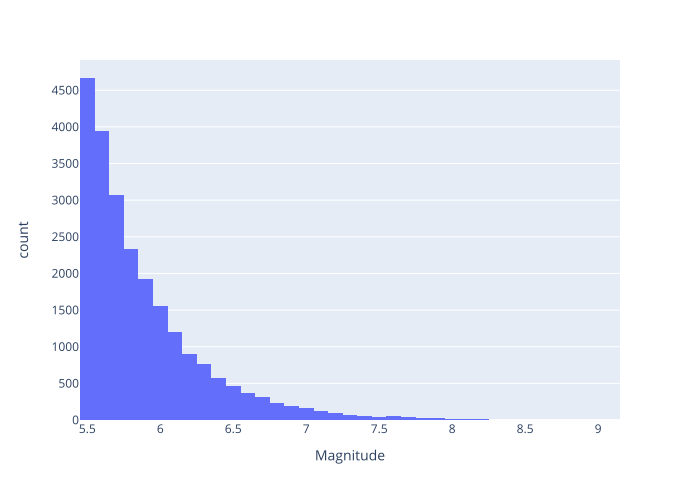

In [83]:
# fig = px.histogram(df_EQ, x="Depth")
# fig.show()

fig = go.Figure(data=[go.Histogram(x=df_EQ["Depth"])], 
          layout=go.Layout(
              title="Distribution of earthquake magnitudes", xaxis_title="Depths", yaxis_title="Count", width=700, height=500))

fig.show()

In [85]:
px.histogram(df_EQ, x = 'Depth')

10. Now, we'd like to explore the evolution of the magnitudes as a function of time :


- Create a dataframe containing the mean magnitudes per day
- Then use this dataset to display the mean magnitudes per day, with a range slider allowing the user to navigate among the dates
- Add a reference line showing the value of the mean magnitude computed over the whole dataset


In [86]:
mean_mag = df_EQ.groupby("Date")["Magnitude"].mean().reset_index().sort_values("Date")
mean_mag.head()

,Date,Magnitude
0,1965-01-02,6.0
1,1965-01-04,5.8
2,1965-01-05,6.2
3,1965-01-08,5.8
4,1965-01-09,5.8


In [92]:
fig = go.Figure()
fig.add_trace(
    go.Scatter(x= mean_mag["Date"], y = mean_mag["Magnitude"])
)
fig.update_layout(
    title_text = "mean magnitude per day", xaxis = dict(rangeslider = {"visible" : True}, type = "date")
)
fig.show()

,Date,Magnitude
0,1965-01-02,6.0
1,1965-01-04,5.8
2,1965-01-05,6.2
3,1965-01-08,5.8
4,1965-01-09,5.8


In [93]:
mean_mag['Mean_Magnitude'] = mean_mag['Magnitude'].mean()

fig.add_trace(
    go.Scatter(
        x = mean_mag['Date'],
        y = mean_mag['Mean_Magnitude'])
)

fig.update_layout(showlegend = False)

fig.show()

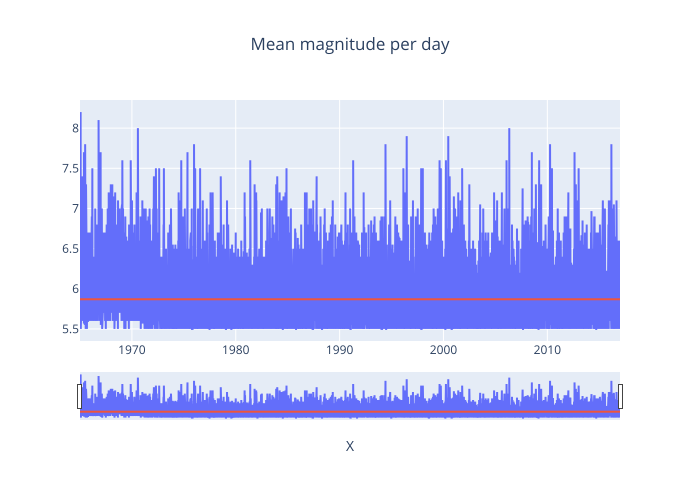

To finish, let's visualize the distribution of the earthquakes around the world.

11. Use plotly express' `scatter_mapbox` to display the earthquakes on a map. Change the color of the markers depending on the value of the magnitude. Use the documentation and [this page](https://plotly.com/python/builtin-colorscales/) to find a suitable colorscale.

In [98]:
fig = px.scatter_map(df_EQ, lat="Latitude", lon="Longitude", color="Magnitude", map_style="open-street-map", zoom=3, color_continuous_scale="Reds")

fig.show()

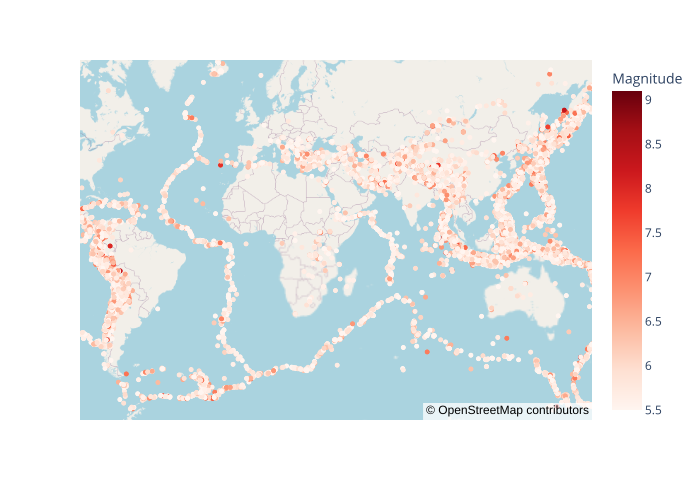

12. Let's make the map animated ! Add some arguments in `scatter_mapbox` to create an animation displaying the earthquakes year by year

In [99]:
fig = px.scatter_map(df_EQ, lat="Latitude", lon="Longitude", color="Magnitude", map_style="open-street-map", zoom=3, color_continuous_scale="Reds", animation_frame="Year")

fig.show()

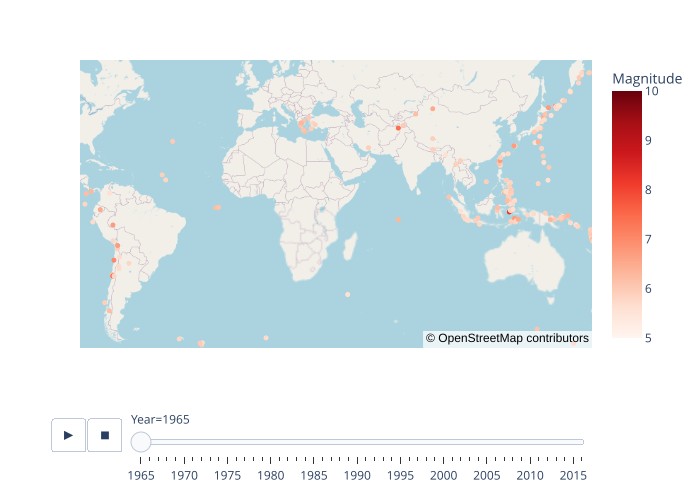

13. **Optional** Look for another function in plotly express that allows to display on a map the *density of earthquakes* (instead of each earthquake separately), and make it animated to display the evolution year by year.

In [102]:
fig = px.density_map(df, lat='Latitude', lon='Longitude', z='Magnitude', radius=10,
                        center=dict(lat=0, lon=180), zoom=3,
                        map_style="open-street-map", animation_frame="Year")
fig.show()

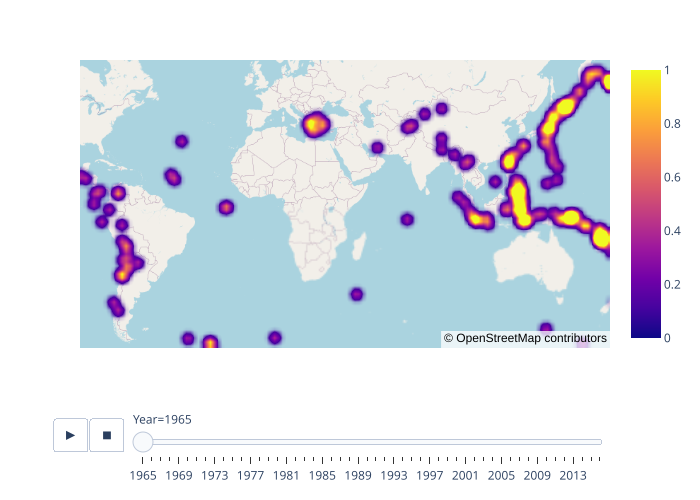